In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pyarrow.parquet as pq
import os

In [14]:
prescriptions_p_df = pd.read_parquet('../mimic_visualization/mimic-iii-clinical-database-1.4/prescriptions_p.parquet')


In [12]:
patients_p_df = pd.read_parquet('../mimic_visualization/mimic-iii-clinical-database-1.4/patients_p.parquet') 

In [13]:
patients_p_df.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13 00:00:00,None,None,None,0
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,None,1
2,236,251,M,2090-03-15 00:00:00,None,None,None,0
3,237,252,M,2078-03-06 00:00:00,None,None,None,0
4,238,253,F,2089-11-26 00:00:00,None,None,None,0


In [7]:
prescriptions_p_df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,STARTDATE,ENDDATE,DRUG_TYPE,DRUG,DRUG_NAME_POE,DRUG_NAME_GENERIC,FORMULARY_DRUG_CD,GSN,NDC,PROD_STRENGTH,DOSE_VAL_RX,DOSE_UNIT_RX,FORM_VAL_DISP,FORM_UNIT_DISP,ROUTE
0,2214776,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Tacrolimus,Tacrolimus,Tacrolimus,TACR1,021796,469061711.0,1mg Capsule,2,mg,2,CAP,PO
1,2214775,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Warfarin,Warfarin,Warfarin,WARF5,006562,56017275.0,5mg Tablet,5,mg,1,TAB,PO
2,2215524,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Heparin Sodium,None,None,HEPAPREMIX,006522,338055002.0,"25,000 unit Premix Bag","25,000",UNIT,1,BAG,IV
3,2216265,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,BASE,D5W,None,None,HEPBASE,None,0.0,HEPARIN BASE,250,ml,250,ml,IV
4,2214773,6,107064,NaN,2175-06-11 00:00:00,2175-06-12 00:00:00,MAIN,Furosemide,Furosemide,Furosemide,FURO20,008208,54829725.0,20mg Tablet,20,mg,1,TAB,PO


In [15]:
most_prescribed = pd.DataFrame(prescriptions_p_df["DRUG"].value_counts().nlargest(10))
print(most_prescribed)

                              count
DRUG                               
Potassium Chloride           192993
Insulin                      143465
D5W                          142241
Furosemide                   133122
0.9% Sodium Chloride         130147
NS                           129731
Magnesium Sulfate             90427
Iso-Osmotic Dextrose          87005
Sodium Chloride 0.9%  Flush   83392
Acetaminophen                 78768


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Potassium Chloride'),
  Text(1, 0, 'Insulin'),
  Text(2, 0, 'D5W'),
  Text(3, 0, 'Furosemide'),
  Text(4, 0, '0.9% Sodium Chloride'),
  Text(5, 0, 'NS'),
  Text(6, 0, 'Magnesium Sulfate'),
  Text(7, 0, 'Iso-Osmotic Dextrose'),
  Text(8, 0, 'Sodium Chloride 0.9%  Flush'),
  Text(9, 0, 'Acetaminophen')])

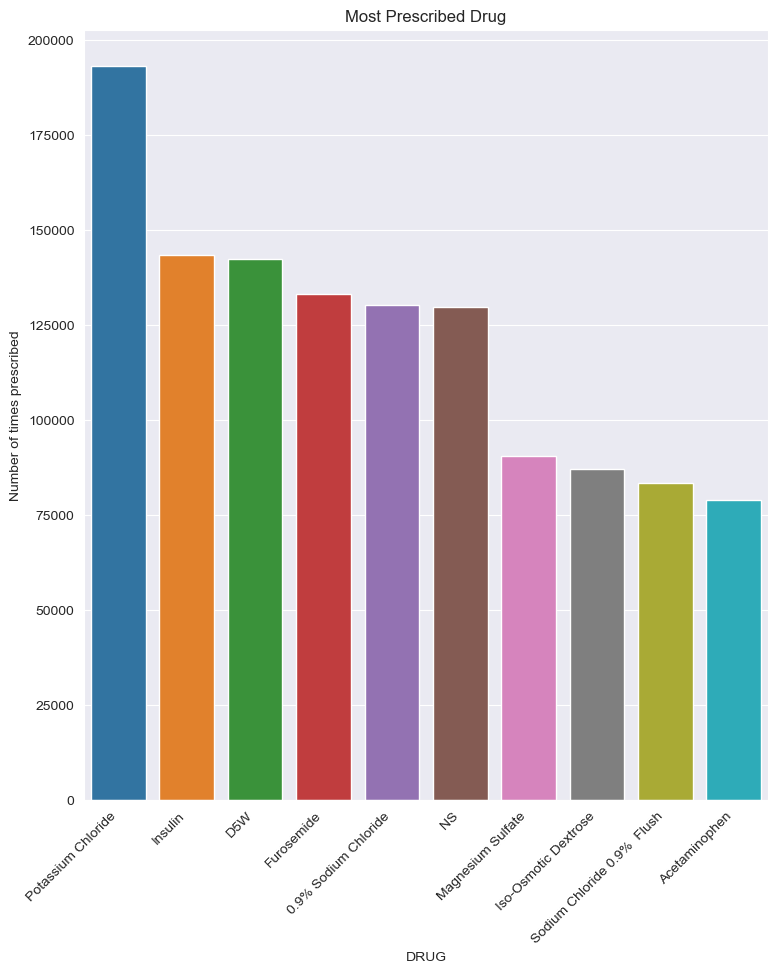

In [17]:
plt.figure(figsize=(30, 10))

# Analysis 1: Count plot of Top 10 most prescribed drugs
plt.subplot(1, 3, 1)
sns.barplot(most_prescribed, x='DRUG',y='count',  hue='DRUG')
plt.title("Most Prescribed Drug")
plt.xlabel("DRUG")
plt.ylabel("Number of times prescribed")
plt.xticks(rotation=45, ha='right')

In [20]:
from datetime import datetime
# Calculate age function
def calculate_age(dob, dod):
    if pd.isna(dob) or pd.isna(dod):
        return None
    dob_date = datetime.strptime(dob, "%Y-%m-%d %H:%M:%S")  
    dod_date = datetime.strptime(dod, "%Y-%m-%d %H:%M:%S")
    age = (dod_date - dob_date).days // 365
    return age

# Apply calculate_age function to create "age" column
patients_p_df["AGE"] = patients_p_df.apply(lambda row: calculate_age(row["DOB"], row["DOD"]), axis=1)

# Filter out rows with age greater than or equal to 120
filtered_df = patients_p_df[patients_p_df["AGE"] < 120]

# Display the updated DataFrame
filtered_df.head()

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG,AGE
1,235,250,F,2164-12-27 00:00:00,2188-11-22 00:00:00,2188-11-22 00:00:00,None,1,23.0
7,241,257,F,2031-04-03 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,2121-07-08 00:00:00,1,90.0
10,244,261,M,2025-08-04 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,2102-06-29 00:00:00,1,76.0
12,246,263,M,2104-06-18 00:00:00,2168-06-13 00:00:00,2168-06-13 00:00:00,None,1,64.0
17,251,268,F,2132-02-21 00:00:00,2198-02-18 00:00:00,2198-02-18 00:00:00,None,1,66.0


In [13]:
filtered_df["EXPIRE_FLAG"].value_counts()

EXPIRE_FLAG
1    14279
Name: count, dtype: int64

In [26]:
# Filter patients who have expired
expired_patients_df = filtered_df[filtered_df["EXPIRE_FLAG"] == 1][["GENDER", "EXPIRE_FLAG","AGE"]]

# Display the new DataFrame
print(expired_patients_df.head())

   GENDER  EXPIRE_FLAG   AGE
1       F            1  23.0
7       F            1  90.0
10      M            1  76.0
12      M            1  64.0
17      F            1  66.0


In [28]:
expired_patients_df["EXPIRE_FLAG"].value_counts()

EXPIRE_FLAG
1    14279
Name: count, dtype: int64

In [54]:

microbio_p_df = pd.read_parquet('../mimic_visualization/mimic-iii-clinical-database-1.4/microbio_events_p.parquet') 

In [55]:
microbio_p_df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,CHARTDATE,CHARTTIME,SPEC_ITEMID,SPEC_TYPE_DESC,ORG_ITEMID,ORG_NAME,ISOLATE_NUM,AB_ITEMID,AB_NAME,DILUTION_TEXT,DILUTION_COMPARISON,DILUTION_VALUE,INTERPRETATION
0,744,96,170324,2156-04-13 00:00:00,2156-04-13 14:18:00,70021.0,BRONCHOALVEOLAR LAVAGE,80026.0,PSEUDOMONAS AERUGINOSA,1.0,NaN,None,None,None,NaN,None
1,745,96,170324,2156-04-20 00:00:00,2156-04-20 13:10:00,70062.0,SPUTUM,NaN,None,NaN,NaN,None,None,None,NaN,None
2,746,96,170324,2156-04-20 00:00:00,2156-04-20 16:00:00,70012.0,BLOOD CULTURE,NaN,None,NaN,NaN,None,None,None,NaN,None
3,747,96,170324,2156-04-20 00:00:00,None,70012.0,BLOOD CULTURE,NaN,None,NaN,NaN,None,None,None,NaN,None
4,748,96,170324,2156-04-20 00:00:00,None,70079.0,URINE,NaN,None,NaN,NaN,None,None,None,NaN,None


In [18]:
microbio_p_df['SPEC_TYPE_DESC'].value_counts()

SPEC_TYPE_DESC
BLOOD CULTURE                         179930
URINE                                 140671
SPUTUM                                 99887
SWAB                                   37895
MRSA SCREEN                            32280
                                       ...  
POST-MORTEM VIRAL CULTURE                  1
TRANSTRACHEAL ASPIRATE                     1
BLOOD BAG FLUID                            1
Influenza A/B by DFA - Bronch Wash         1
C, E, & A Screening                        1
Name: count, Length: 87, dtype: int64

In [11]:

admissions_p_df = pd.read_parquet('../mimic_visualization/mimic-iii-clinical-database-1.4/admissions_p.parquet') 
admissions_p_df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,None,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,None,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,None,CATHOLIC,MARRIED,WHITE,None,None,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,None,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,None,None,BRAIN MASS,0,1
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,None,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,None,PROTESTANT QUAKER,SINGLE,WHITE,None,None,INTERIOR MYOCARDIAL INFARCTION,0,1
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,None,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1


In [49]:
hospital_deaths_df = admissions_p_df[admissions_p_df['HOSPITAL_EXPIRE_FLAG']==1]
hospital_deaths_count_df = hospital_deaths_df['ADMISSION_TYPE'].value_counts()

array([<Axes: ylabel='%'>], dtype=object)

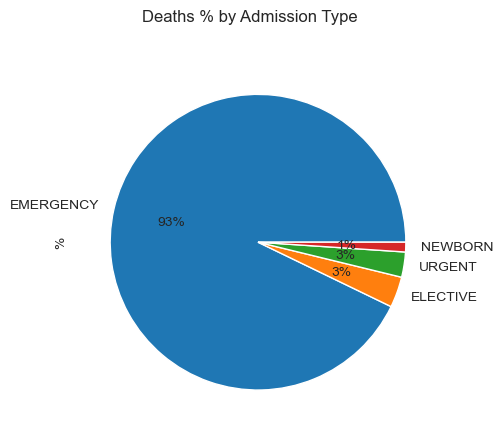

In [51]:
# Plot pie chart for hospital deaths by admission type

hospital_deaths_count_df.plot.pie(
    xlabel='Deaths % by Admission',
    ylabel='%',
    autopct='%1.0f%%',
    subplots=True,
    title='Deaths % by Admission Type',
)

In [57]:
admission_microbio_df = pd.merge(admissions_p_df, microbio_p_df, how='inner', on='HADM_ID')
admission_microbio_df.head()

,ROW_ID_x,SUBJECT_ID_x,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,...,SPEC_TYPE_DESC,ORG_ITEMID,ORG_NAME,ISOLATE_NUM,AB_ITEMID,AB_NAME,DILUTION_TEXT,DILUTION_COMPARISON,DILUTION_VALUE,INTERPRETATION
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,...,URINE,NaN,None,NaN,NaN,None,None,None,NaN,None
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,None,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,...,STOOL,NaN,None,NaN,NaN,None,None,None,NaN,None
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,None,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,...,SPUTUM,NaN,None,NaN,NaN,None,None,None,NaN,None
3,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,...,BLOOD CULTURE,NaN,None,NaN,NaN,None,None,None,NaN,None
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,...,BLOOD CULTURE,NaN,None,NaN,NaN,None,None,None,NaN,None


In [61]:
import pandas as pd
import plotly.express as px

admission_microbio_df = pd.merge(admissions_p_df, microbio_p_df, how='inner', on='HADM_ID')

pivot_table = admission_microbio_df.pivot_table(index='SPEC_TYPE_DESC', columns='ADMISSION_TYPE', aggfunc='size', fill_value=0).reset_index()

pivot_table_melted = pivot_table.melt(id_vars='SPEC_TYPE_DESC', var_name='ADMISSION_TYPE', value_name='Count')

fig = px.bar(pivot_table_melted, x='SPEC_TYPE_DESC', y='Count', color='ADMISSION_TYPE', barmode='stack', title='Count of Specimen Types by Admission Type')

fig.show()

In [30]:
admissions_micro_diab_df = admission_microbio_df[admission_microbio_df['DIAGNOSIS'].str.contains("DIABET", na=False)]
#admissions_micro_diab_df['DIAGNOSIS', 'SPEC_TYPE_DESC']

In [22]:
insulin_prescribed_df = prescriptions_p_df[prescriptions_p_df['DRUG'] == 'Insulin']

In [33]:
admission_prescription_df = pd.merge(insulin_prescribed_df, admissions_p_df, how='inner', on='HADM_ID', suffixes=('', '_y'))


In [34]:
admission_prescription_df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,STARTDATE,ENDDATE,DRUG_TYPE,DRUG,DRUG_NAME_POE,DRUG_NAME_GENERIC,...,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
0,2122374,13,143045,NaN,2167-01-08 00:00:00,2167-01-09 00:00:00,MAIN,Insulin,Insulin,Insulin,...,Medicaid,None,OTHER,None,WHITE,None,None,CORONARY ARTERY DISEASE,0,1
1,1213827,4,185777,294638.0,2191-03-16 00:00:00,2191-03-16 00:00:00,MAIN,Insulin,Insulin,Insulin Glargine,...,Private,None,PROTESTANT QUAKER,SINGLE,WHITE,2191-03-15 13:10:00,2191-03-16 01:10:00,"FEVER,DEHYDRATION,FAILURE TO THRIVE",0,1
2,1213826,4,185777,294638.0,2191-03-16 00:00:00,2191-03-16 00:00:00,MAIN,Insulin,Insulin,Insulin,...,Private,None,PROTESTANT QUAKER,SINGLE,WHITE,2191-03-15 13:10:00,2191-03-16 01:10:00,"FEVER,DEHYDRATION,FAILURE TO THRIVE",0,1
3,1213836,4,185777,294638.0,2191-03-16 00:00:00,2191-03-19 00:00:00,MAIN,Insulin,Insulin,Insulin,...,Private,None,PROTESTANT QUAKER,SINGLE,WHITE,2191-03-15 13:10:00,2191-03-16 01:10:00,"FEVER,DEHYDRATION,FAILURE TO THRIVE",0,1
4,1213837,4,185777,294638.0,2191-03-16 00:00:00,2191-03-19 00:00:00,MAIN,Insulin,Insulin,Insulin Glargine,...,Private,None,PROTESTANT QUAKER,SINGLE,WHITE,2191-03-15 13:10:00,2191-03-16 01:10:00,"FEVER,DEHYDRATION,FAILURE TO THRIVE",0,1


In [35]:
admission_prescription_df.drop(admission_prescription_df.filter(regex='_y$').columns, axis=1, inplace=True)

In [36]:
patient_admission_prescription_df = pd.merge(admission_prescription_df, patients_p_df, how='inner', on='SUBJECT_ID')

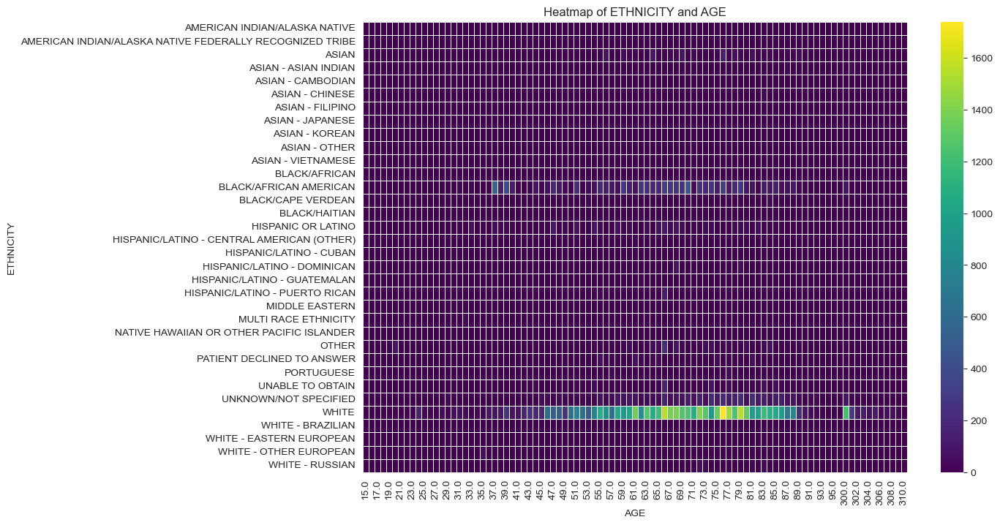

In [47]:
# Create a pivot table with ETHNICITY and AGE
pivot_table = patient_admission_prescription_df.pivot_table(index='ETHNICITY', columns='AGE', aggfunc='size', fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='viridis', linewidths=.5)
plt.title('Heatmap of ETHNICITY and AGE')
plt.xlabel('AGE')
plt.ylabel('ETHNICITY')
plt.show()

In [3]:
icustays_p_df = pd.read_parquet('../mimic_visualization/mimic-iii-clinical-database-1.4/icustays_p.parquet') 
icustays_p_df.head()

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS
0,365,268,110404,280836,carevue,MICU,MICU,52,52,2198-02-14 23:27:38,2198-02-18 05:26:11,3.2490
1,366,269,106296,206613,carevue,MICU,MICU,52,52,2170-11-05 11:05:29,2170-11-08 17:46:57,3.2788
2,367,270,188028,220345,carevue,CCU,CCU,57,57,2128-06-24 15:05:20,2128-06-27 12:32:29,2.8939
3,368,271,173727,249196,carevue,MICU,SICU,52,23,2120-08-07 23:12:42,2120-08-10 00:39:04,2.0600
4,369,272,164716,210407,carevue,CCU,CCU,57,57,2186-12-25 21:08:04,2186-12-27 12:01:13,1.6202


In [9]:
icustays_p_df['FIRST_CAREUNIT'].value_counts()

FIRST_CAREUNIT
MICU     21088
CSRU      9312
SICU      8891
NICU      8100
CCU       7726
TSICU     6415
Name: count, dtype: int64

In [12]:
admission_icu_df = pd.merge(admissions_p_df, icustays_p_df, how='inner', on='HADM_ID')
admission_icu_df.head()

,ROW_ID_x,SUBJECT_ID_x,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,...,SUBJECT_ID_y,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,...,22,204798,carevue,MICU,MICU,52,52,2196-04-09 12:27:00,2196-04-10 15:54:00,1.1438
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,None,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,...,23,227807,carevue,CSRU,CSRU,14,14,2153-09-03 09:38:55,2153-09-04 15:59:11,1.2641
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,None,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,...,23,234044,metavision,SICU,SICU,57,57,2157-10-21 11:40:38,2157-10-22 16:08:48,1.1862
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,None,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,...,24,262236,carevue,CCU,CCU,7,7,2139-06-06 16:15:36,2139-06-07 04:33:25,0.5124
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,None,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,...,25,203487,carevue,CCU,CCU,7,7,2160-11-02 03:16:23,2160-11-05 16:23:27,3.5466


In [26]:
nicu_admissions_df = admission_icu_df[admission_icu_df['FIRST_CAREUNIT'] == 'NICU']
nicu_admissions_df.head()

,ROW_ID_x,SUBJECT_ID_x,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,...,SUBJECT_ID_y,ICUSTAY_ID,DBSOURCE,FIRST_CAREUNIT,LAST_CAREUNIT,FIRST_WARDID,LAST_WARDID,INTIME,OUTTIME,LOS
6,27,27,134931,2191-11-30 22:16:00,2191-12-03 14:45:00,None,NEWBORN,PHYS REFERRAL/NORMAL DELI,HOME,Private,...,27,298615,carevue,NICU,NICU,56,56,2191-11-30 22:21:15,2191-12-01 01:28:12,0.1298
20,41,39,106266,2114-11-29 21:04:00,2114-12-09 15:10:00,None,NEWBORN,PHYS REFERRAL/NORMAL DELI,HOME,Private,...,39,249426,carevue,NICU,NICU,26,26,2114-11-29 21:17:00,2114-12-09 15:10:00,9.7451
28,461,358,110872,2168-10-24 23:48:00,2168-10-29 03:23:00,None,NEWBORN,PHYS REFERRAL/NORMAL DELI,HOME,Private,...,358,245967,carevue,NICU,NICU,56,56,2168-10-25 00:05:13,2168-10-25 08:54:53,0.3678
29,461,358,110872,2168-10-24 23:48:00,2168-10-29 03:23:00,None,NEWBORN,PHYS REFERRAL/NORMAL DELI,HOME,Private,...,358,244658,carevue,NICU,NICU,56,56,2168-10-29 09:24:39,2168-10-29 15:24:34,0.2499
37,468,363,196503,2176-03-01 15:26:00,2176-03-03 14:04:00,None,NEWBORN,CLINIC REFERRAL/PREMATURE,HOME,Government,...,363,274564,carevue,NICU,NICU,56,56,2176-03-01 16:05:05,2176-03-01 18:45:05,0.1111


In [14]:
nicu_admissions_df['DIAGNOSIS'].value_counts()

DIAGNOSIS
NEWBORN                                    7840
PREMATURITY                                  95
HYPERBILIRUBINEMIA                           78
RESPIRATORY DISTRESS                          8
EXTREME PREMATURITY                           6
                                           ... 
INTERMEDIATE CARE                             1
HYPERBILIRUBINEMA                             1
S/P G-TUBE PLACEMENT                          1
DECREASE TEMPERATURE;HYPERBILIRUBINEMIA       1
EXTREME PREMATURITY/? SEPSIS                  1
Name: count, Length: 62, dtype: int64

In [43]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool

output_notebook()

nicu_admissions_df.loc[:, 'INTIME'] = pd.to_datetime(nicu_admissions_df['INTIME'])

source = ColumnDataSource(nicu_admissions_df)

p = figure(x_axis_type='datetime', height=400, width=800, title="NICU Length of Stay Over Time",
           toolbar_location='above', tools="pan,wheel_zoom,box_zoom,reset")

p.scatter(x='INTIME', y='LOS', source=source, size=5, color='orange', alpha=0.5)

p.xaxis.axis_label = 'Time'
p.yaxis.axis_label = 'Length of Stay (days)'

hover = HoverTool()
hover.tooltips = [("Time", "@INTIME{%F %T}"), ("Length of Stay", "@LOS"),("ROW_ID", "@ROW_ID_x"), ("DIAGNOSIS", "@DIAGNOSIS")]
hover.formatters = {'@INTIME': 'datetime'}
p.add_tools(hover)

show(p)

Loading BokehJS ...

In [37]:
micu_admissions_df = admission_icu_df[admission_icu_df['FIRST_CAREUNIT'] == 'MICU']
micu_admissions_df['DIAGNOSIS'].value_counts()

DIAGNOSIS
PNEUMONIA                                  1365
SEPSIS                                     1026
GASTROINTESTINAL BLEED                      613
ALTERED MENTAL STATUS                       559
UPPER GI BLEED                              482
                                           ... 
SHORTNESS OFR BREATH                          1
RECURRENT BILIARY CANCER                      1
ANEMIA;THROMBOCYTOPENIA;PROSTATE CANCER       1
CANCER OF KIDNEY/SDA                          1
PNEUMNOIA                                     1
Name: count, Length: 6211, dtype: int64

In [38]:
output_notebook()

micu_admissions_df.loc[:, 'INTIME'] = pd.to_datetime(micu_admissions_df['INTIME'])

source = ColumnDataSource(micu_admissions_df)

p = figure(x_axis_type='datetime', height=400, width=800, title="MICU Length of Stay Over Time",
           toolbar_location='above', tools="pan,wheel_zoom,box_zoom,reset")

p.line(x='INTIME', y='LOS', source=source, line_width=2, legend_label='Length of Stay')

p.scatter(x='INTIME', y='LOS', source=source, size=5, color='navy', alpha=0.5)

p.xaxis.axis_label = 'Time'
p.yaxis.axis_label = 'Length of Stay (days)'
p.legend.location = 'top_left'

hover = HoverTool()
hover.tooltips = [("Time", "@INTIME{%F %T}"), ("Length of Stay", "@LOS")]
hover.formatters = {'@INTIME': 'datetime'}
p.add_tools(hover)

show(p)

Loading BokehJS ...

In [40]:
micu_admissions_df.loc[:, 'OUTTIME'] = pd.to_datetime(micu_admissions_df['OUTTIME'])
micu_admissions_df.loc[:, 'INTIME'] = pd.to_datetime(micu_admissions_df['INTIME'])

# Extract the year from 'INTIME' and create a new column 'INTIME_YEAR' using .loc to avoid the warning
micu_admissions_df.loc[:, 'INTIME_YEAR'] = micu_admissions_df['INTIME'].dt.year

# Calculate the mean LOS for each care unit and year
los_stats = micu_admissions_df.groupby(['FIRST_CAREUNIT', 'INTIME_YEAR'])['LOS'].mean().reset_index()
los_stats.head()

,FIRST_CAREUNIT,INTIME_YEAR,LOS
0,MICU,2100,3.095125
1,MICU,2101,4.173584
2,MICU,2102,4.704987
3,MICU,2103,3.677555
4,MICU,2104,3.919162


In [41]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import ColumnDataSource, HoverTool

output_notebook()

source = ColumnDataSource(los_stats)

p = figure(x_axis_type='datetime', height=400, width=800, title="Length of Stay Over Time",
           toolbar_location='above', tools="pan,wheel_zoom,box_zoom,reset")

p.line(x='INTIME_YEAR', y='LOS', source=source, line_width=2, legend_label='Length of Stay')

p.xaxis.axis_label = 'Year'
p.yaxis.axis_label = 'Length of Stay (days)'
p.legend.location = 'top_left'

hover = HoverTool()
hover.tooltips = [("Year", "@INTIME_YEAR{%Y}"), ("Length of Stay", "@LOS")]
hover.formatters = {'@INTIME_YEAR': 'datetime'}
p.add_tools(hover)

show(p)

Loading BokehJS ...